# Imports

My workspace for Computer Vision


In [1]:
import numpy as np
from scipy import ndimage
import matplotlib.pylab as pl
from google.colab import files, drive
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from keras.layers import Input, Dense, Flatten, Conv2D, MaxPooling2D, UpSampling2D
from keras.models import Model
from keras import backend as K
from sklearn.metrics import mean_squared_error
import math

from keras.utils import plot_model

Using TensorFlow backend.


In [2]:
drive.mount('/content/drive/')
path = "drive/My Drive/computer_vision/"

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive/


# Production of data

# Plot matrices and load images


In [0]:
# load matrices
xtrain = np.load(path+'x_train.npy')
xval = np.load(path+'x_val.npy')
ytrain = np.load(path+'y_train.npy')
yval = np.load(path+'y_val.npy')

Text(0.5, 1.0, 'Cow 2')

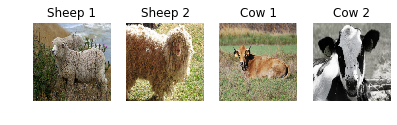

In [0]:
# plot 2 "good" images of each class
pl.figure(1, figsize=(6.4, 3))

pl.subplot(1, 4, 1)
pl.imshow(xtrain[3])
pl.axis('off')
pl.title('Sheep 1')

pl.subplot(1, 4, 2)
pl.imshow(xtrain[1])
pl.axis('off')
pl.title('Sheep 2')

pl.subplot(1, 4, 3)
pl.imshow(xtrain[-1])
pl.axis('off')
pl.title('Cow 1')

pl.subplot(1, 4, 4)
pl.imshow(xtrain[-2])
pl.axis('off')
pl.title('Cow 2')

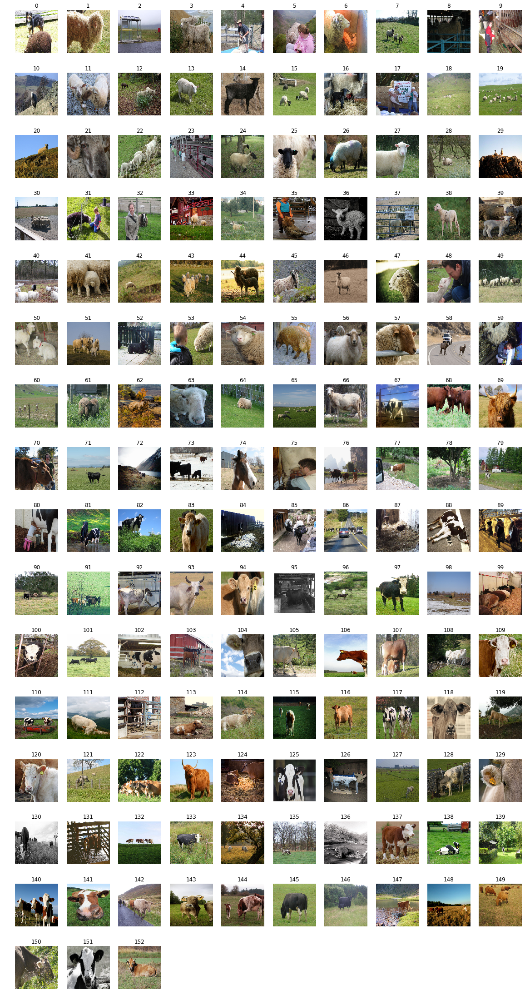

In [0]:
# plot whole training set
pl.figure(1, figsize=(20, 40))
for i in range(len(xtrain)):
    pl.subplot(16, 10, i+1)
    pl.imshow(xtrain[i])
    pl.axis('off')
    pl.title(str(i))

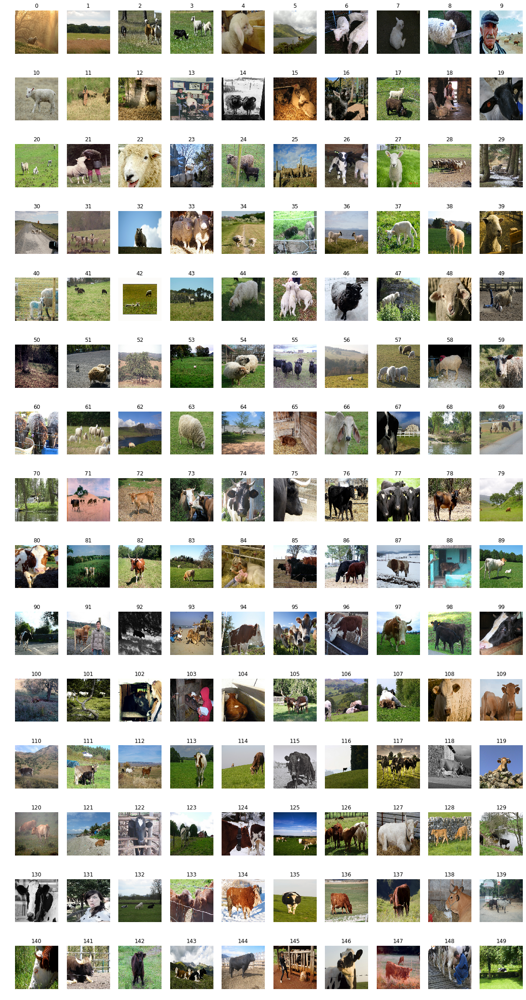

In [0]:
# plot whole validation set
pl.figure(1, figsize=(20, 40))
for i in range(len(xval)):
    pl.subplot(15, 10, i+1)
    pl.imshow(xval[i])
    pl.axis('off')
    pl.title(str(i))

# AutoEncoders


## PCA vs Auto-encoders


PCA aim: find a few directions in the input space explaining the variation in the input data; project the data onto those dimentionss

--> linear relationship between the data and the learned representation

Here 2 PCs used (reduction from dimension 137388 to 2; of course bad, but to be able to plot)





AE: NN whose outputs are its own inputs; same objective function as PCA

Goal = minimize reconstruction error

inputs x --> lower dim z = f(Wx) --> reconstruction higher dim ~x = g(Vz)

goal --> min sum (x - ~x)^2 

         --> = min sum (x - VWx)^2        if f and g are linear
         
                      => optimal solution is PCA
                      
2 neurons in hidden layer --> approximate to reducing data to 2 features

With linear activation function and a single hidden layer of size p, the weights of the AE span the same vector subspace as the one spanned by the first p components of PCA, and the output of AE is an orthogonal projection onto this subspace

/!\ AE weights != PCs --> in general weights not orthogonal but the PCs can be recovered using Singular Value Decomposition (Plaut, E.,From Principal Subspaces to Principal Components with Linear Autoencoders, Arxiv.org:1804.10253.)

--> to compare PCA and AE, compare reconstruction error


Reconstruction error for PCA - small values as values between 0 and 1: 
- 2 PC -->PCA:  0.042292733 --------- LAE: 0.064802356
- 16 PCs --> 0.022215268 --------- LAE: 0.026056455
- 50 PCs --> 0.010987376 --------- LAE: 0.026697977
- all PCs --> 5.317535e-13 --------- LAE: 0.03401486


16 components explained variance ratio = 10^-2 or more other evr = 10^-3 or less 



From visual evaluation here PCA is better than linear AE
From reconstruction error comparison here PCA is better than linear AE



- the autoencoder is better at reconstructing the original data set than PCA when p is small (but the error converges as p increases) --> for very large data sets this difference will be larger --> means that same accuracy can be achieved with less components than for PCA and hence a smaller data set

- in PCA, we can choose the #PCs based on the % of variability they explain; with AE, we don't know how many to keep (can you PCA to determine how many neurons in hidden layer)


- better visualization possible with AE than with PCA

### PCA

In [0]:
# reshape: 153 x 256*256*3 = 153 x 196608
# if 128 --> 49152
xrs = xtrain.reshape(len(xtrain), len(xtrain[0])*len(xtrain[0,0])*len(xtrain[0,0,0]))
# scale (mean-center)
# scaler = StandardScaler()
# scaler.fit(xrs)
# xscaled = scaler.transform(xrs)
# centering done in decomposition.PCA method
# no need to scale as all same scale (all values represent a pixel)
# already between 0 and 1
xscaled = xrs
xvrs = xval.reshape(len(xval), len(xval[0])*len(xval[0,0])*len(xval[0,0,0]))
# use scaler fitted on xtrain because no assumptions about xval
# xvscaled = scaler.transform(xvrs)
xvscaled = xvrs

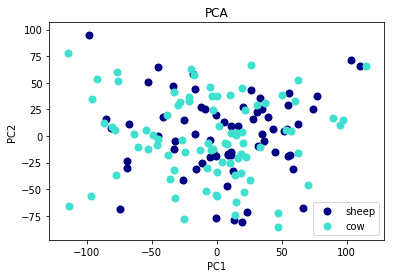

In [0]:
# PCA
pca = PCA()
pca_transformed = pca.fit_transform(xscaled)

# Get first 2 PCs
pca_2pcs = pca_transformed[:,:2]

# Plot 2 PCs of PCA
plt.figure()
lw = 2
for i in range(67):
  if i==0:
    plt.scatter(pca_2pcs[i, 0], pca_2pcs[i, 1], color='navy', alpha=1., lw=lw,
                label='sheep')
  else: # otherwise one point per sample in legend
    plt.scatter(pca_2pcs[i, 0], pca_2pcs[i, 1], color='navy', alpha=1., lw=lw)
    
for i in range(86):
  if i==0:
    plt.scatter(pca_2pcs[67+i, 0], pca_2pcs[67+i, 1], color='turquoise', alpha=1.,
                lw=lw, label='cow')
  else:
    plt.scatter(pca_2pcs[67+i, 0], pca_2pcs[67+i, 1], color='turquoise', alpha=1.,
                lw=lw)
   
    
plt.legend(loc='best', shadow=False, scatterpoints=1)
plt.title('PCA')  
plt.xlabel('PC' + "1")
plt.ylabel('PC' + "2")
plt.show()


Text(0, 0.5, 'Cumulative explained variance')

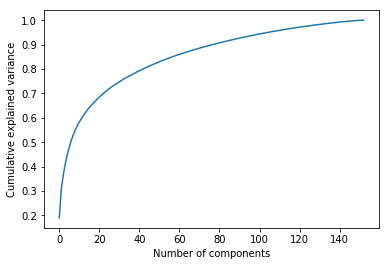

In [0]:
#print(pca.explained_variance_ratio_) 

# not fast and big increase in cumsum --> var distributed over a lot of components
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


5.6302375e-05


Text(0.5, 1.0, 'Cow 2')

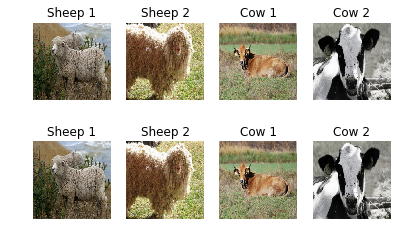

In [0]:
# Reconstruction with 2 components
pca = PCA(n_components=150) #2
pca_transformed = pca.fit_transform(xscaled)
inv_pca = pca.inverse_transform(pca_transformed)
inv_xtrain = inv_pca.reshape(len(xtrain), len(xtrain[0]), len(xtrain[0,0]), len(xtrain[0,0,0]))

print(mean_squared_error(xrs,inv_pca))


# plot 2 "good" images of each class
pl.figure(1, figsize=(6.4, 4))

pl.subplot(2, 4, 1)
pl.imshow(xtrain[3])
pl.axis('off')
pl.title('Sheep 1')

pl.subplot(2, 4, 2)
pl.imshow(xtrain[1])
pl.axis('off')
pl.title('Sheep 2')

pl.subplot(2, 4, 3)
pl.imshow(xtrain[-1])
pl.axis('off')
pl.title('Cow 1')

pl.subplot(2, 4, 4)
pl.imshow(xtrain[-2])
pl.axis('off')
pl.title('Cow 2')

pl.subplot(2, 4, 5)
pl.imshow(inv_xtrain[3])
pl.axis('off')
pl.title('Sheep 1')

pl.subplot(2, 4, 6)
pl.imshow(inv_xtrain[1])
pl.axis('off')
pl.title('Sheep 2')

pl.subplot(2, 4, 7)
pl.imshow(inv_xtrain[-1])
pl.axis('off')
pl.title('Cow 1')

pl.subplot(2, 4, 8)
pl.imshow(inv_xtrain[-2])
pl.axis('off')
pl.title('Cow 2')

### AE


**PCA** with 2 PCs does not allow to separate the 2 classes
 (quite expected... drastic dimensionality reduction)
 
 --> variance quite spread over many components

Instructions for updating:
Colocations handled automatically by placer.
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 196608)            0         
_________________________________________________________________
dense_1 (Dense)              (None, 2)                 393218    
_________________________________________________________________
dense_2 (Dense)              (None, 196608)            589824    
Total params: 983,042
Trainable params: 983,042
Non-trainable params: 0
_________________________________________________________________
None
Instructions for updating:
Use tf.cast instead.


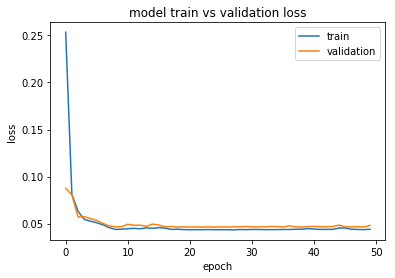

In [0]:
# Create an AE and fit it with the data using 2 neurons in the hidden layer (to compare with 2 PCs)
# --> fully-connected
# --> use linear activation function
input_dim = xscaled.shape[1] # size*size*3
encoding_dim = 2  
input_img = Input(shape=(input_dim,))
encoded = Dense(encoding_dim, activation='linear')(input_img)
decoded = Dense(input_dim, activation='linear')(encoded)
autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer='adam', loss='mse')
print(autoencoder.summary())

history = autoencoder.fit(xscaled, xscaled,
                epochs=50,
                batch_size=16,
                shuffle=True,
                validation_data=(xvscaled, xvscaled),
                         verbose=0)

# Plot the loss --> MSE
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model train vs validation loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()

# Use the encoded layer to encode the training input
encoder = Model(input_img, encoded)
encoded_input = Input(shape=(encoding_dim,))
decoder_layer = autoencoder.layers[-1]
decoder = Model(encoded_input, decoder_layer(encoded_input))
encoded_data = encoder.predict(xscaled)

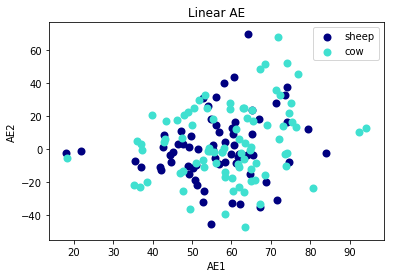

In [0]:
# Get first 2 features --> weight vectors
ae_weights = encoded_data[:,:2] # normally already shape (153, 2) with 2 neurons

# Plot the 2 weight vectors of AE
plt.figure()
lw = 2
for i in range(67):
  if i==0:
    plt.scatter(ae_weights[i, 0], ae_weights[i, 1], color='navy', alpha=1., lw=lw,
                label='sheep')
  else: # otherwise one point per sample in legend
    plt.scatter(ae_weights[i, 0], ae_weights[i, 1], color='navy', alpha=1., lw=lw)
    
for i in range(86):
  if i==0:
    plt.scatter(ae_weights[67+i, 0], ae_weights[67+i, 1], color='turquoise', alpha=1.,
                lw=lw, label='cow')
  else:
    plt.scatter(ae_weights[67+i, 0], ae_weights[67+i, 1], color='turquoise', alpha=1.,
                lw=lw)
   
    
plt.legend(loc='best', shadow=False, scatterpoints=1)
plt.title('Linear AE')  
plt.xlabel('AE' + "1")
plt.ylabel('AE' + "2")
plt.show()

Linear AE very similar to PCA

### Reconstruction AE diff #neurons

0.044303462


Text(0.5, 1.0, 'Cow 2')

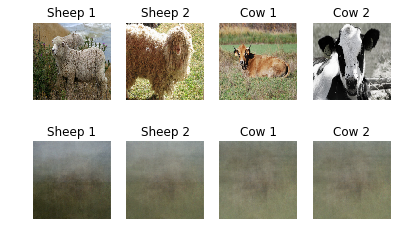

In [0]:
decoded_data = autoencoder.predict(xscaled)
decoded_imgs = decoded_data.reshape(len(xtrain), len(xtrain[0]), len(xtrain[0,0]), len(xtrain[0,0,0]))

print(mean_squared_error(xrs,decoded_data))

# plot 2 "good" images of each class
pl.figure(1, figsize=(6.4, 4))

pl.subplot(2, 4, 1)
pl.imshow(xtrain[3])
pl.axis('off')
pl.title('Sheep 1')

pl.subplot(2, 4, 2)
pl.imshow(xtrain[1])
pl.axis('off')
pl.title('Sheep 2')

pl.subplot(2, 4, 3)
pl.imshow(xtrain[-1])
pl.axis('off')
pl.title('Cow 1')

pl.subplot(2, 4, 4)
pl.imshow(xtrain[-2])
pl.axis('off')
pl.title('Cow 2')

pl.subplot(2, 4, 5)
pl.imshow(decoded_imgs[3])
pl.axis('off')
pl.title('Sheep 1')

pl.subplot(2, 4, 6)
pl.imshow(decoded_imgs[1])
pl.axis('off')
pl.title('Sheep 2')

pl.subplot(2, 4, 7)
pl.imshow(decoded_imgs[-1])
pl.axis('off')
pl.title('Cow 1')

pl.subplot(2, 4, 8)
pl.imshow(decoded_imgs[-2])
pl.axis('off')
pl.title('Cow 2')

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         (None, 196608)            0         
_________________________________________________________________
dense_3 (Dense)              (None, 16)                3145744   
_________________________________________________________________
dense_4 (Dense)              (None, 196608)            3342336   
Total params: 6,488,080
Trainable params: 6,488,080
Non-trainable params: 0
_________________________________________________________________
None


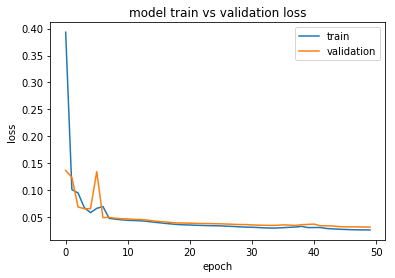

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.025116699


Text(0.5, 1.0, 'Cow 2')

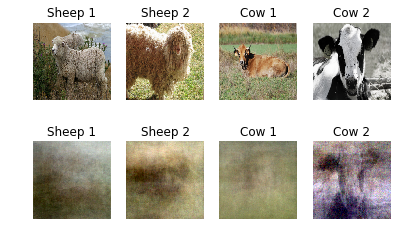

In [0]:
# Create an AE and fit it with the data using 16 neurons in the hidden layer (to compare with 16 PCs)
# --> fully-connected
# --> use linear activation function
input_dim = xscaled.shape[1] # size*size*3
encoding_dim = 16  
input_img = Input(shape=(input_dim,))
encoded = Dense(encoding_dim, activation='linear')(input_img)
decoded = Dense(input_dim, activation='linear')(encoded)
autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer='adam', loss='mse')
print(autoencoder.summary())

history = autoencoder.fit(xscaled, xscaled,
                epochs=50,
                batch_size=16,
                shuffle=True,
                validation_data=(xvscaled, xvscaled),
                verbose = 0)

# Plot the loss --> MSE
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model train vs validation loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()

# Use the encoded layer to encode the training input
encoder = Model(input_img, encoded)
encoded_input = Input(shape=(encoding_dim,))
decoder_layer = autoencoder.layers[-1]
decoder = Model(encoded_input, decoder_layer(encoded_input))
encoded_data = encoder.predict(xscaled)

decoded_data = autoencoder.predict(xscaled)
decoded_imgs = decoded_data.reshape(len(xtrain), len(xtrain[0]), len(xtrain[0,0]), len(xtrain[0,0,0]))

print(mean_squared_error(xrs,decoded_data))

# plot 2 "good" images of each class
pl.figure(1, figsize=(6.4, 4))

pl.subplot(2, 4, 1)
pl.imshow(xtrain[3])
pl.axis('off')
pl.title('Sheep 1')

pl.subplot(2, 4, 2)
pl.imshow(xtrain[1])
pl.axis('off')
pl.title('Sheep 2')

pl.subplot(2, 4, 3)
pl.imshow(xtrain[-1])
pl.axis('off')
pl.title('Cow 1')

pl.subplot(2, 4, 4)
pl.imshow(xtrain[-2])
pl.axis('off')
pl.title('Cow 2')

pl.subplot(2, 4, 5)
pl.imshow(decoded_imgs[3])
pl.axis('off')
pl.title('Sheep 1')

pl.subplot(2, 4, 6)
pl.imshow(decoded_imgs[1])
pl.axis('off')
pl.title('Sheep 2')

pl.subplot(2, 4, 7)
pl.imshow(decoded_imgs[-1])
pl.axis('off')
pl.title('Cow 1')

pl.subplot(2, 4, 8)
pl.imshow(decoded_imgs[-2])
pl.axis('off')
pl.title('Cow 2')

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         (None, 196608)            0         
_________________________________________________________________
dense_5 (Dense)              (None, 50)                9830450   
_________________________________________________________________
dense_6 (Dense)              (None, 196608)            10027008  
Total params: 19,857,458
Trainable params: 19,857,458
Non-trainable params: 0
_________________________________________________________________
None


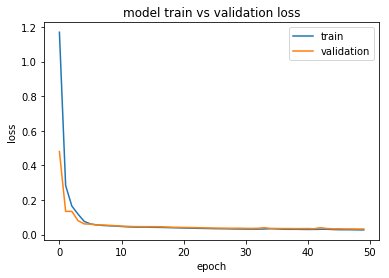

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.026619881


Text(0.5, 1.0, 'Cow 2')

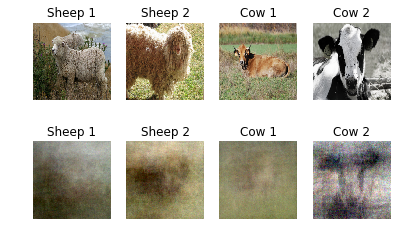

In [0]:
# Create an AE and fit it with the data using 50 neurons in the hidden layer (to compare with 50 PCs)
# --> fully-connected
# --> use linear activation function
input_dim = xscaled.shape[1] # size*size*3
encoding_dim = 50  
input_img = Input(shape=(input_dim,))
encoded = Dense(encoding_dim, activation='linear')(input_img)
decoded = Dense(input_dim, activation='linear')(encoded)
autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer='adam', loss='mse')
print(autoencoder.summary())

history = autoencoder.fit(xscaled, xscaled,
                epochs=50,
                batch_size=16,
                shuffle=True,
                validation_data=(xvscaled, xvscaled),
                verbose = 0)

# Plot the loss --> MSE
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model train vs validation loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()

# Use the encoded layer to encode the training input
encoder = Model(input_img, encoded)
encoded_input = Input(shape=(encoding_dim,))
decoder_layer = autoencoder.layers[-1]
decoder = Model(encoded_input, decoder_layer(encoded_input))
encoded_data = encoder.predict(xscaled)

decoded_data = autoencoder.predict(xscaled)
decoded_imgs = decoded_data.reshape(len(xtrain), len(xtrain[0]), len(xtrain[0,0]), len(xtrain[0,0,0]))

print(mean_squared_error(xrs,decoded_data))

# plot 2 "good" images of each class
pl.figure(1, figsize=(6.4, 4))

pl.subplot(2, 4, 1)
pl.imshow(xtrain[3])
pl.axis('off')
pl.title('Sheep 1')

pl.subplot(2, 4, 2)
pl.imshow(xtrain[1])
pl.axis('off')
pl.title('Sheep 2')

pl.subplot(2, 4, 3)
pl.imshow(xtrain[-1])
pl.axis('off')
pl.title('Cow 1')

pl.subplot(2, 4, 4)
pl.imshow(xtrain[-2])
pl.axis('off')
pl.title('Cow 2')

pl.subplot(2, 4, 5)
pl.imshow(decoded_imgs[3])
pl.axis('off')
pl.title('Sheep 1')

pl.subplot(2, 4, 6)
pl.imshow(decoded_imgs[1])
pl.axis('off')
pl.title('Sheep 2')

pl.subplot(2, 4, 7)
pl.imshow(decoded_imgs[-1])
pl.axis('off')
pl.title('Cow 1')

pl.subplot(2, 4, 8)
pl.imshow(decoded_imgs[-2])
pl.axis('off')
pl.title('Cow 2')

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_7 (InputLayer)         (None, 196608)            0         
_________________________________________________________________
dense_7 (Dense)              (None, 153)               30081177  
_________________________________________________________________
dense_8 (Dense)              (None, 196608)            30277632  
Total params: 60,358,809
Trainable params: 60,358,809
Non-trainable params: 0
_________________________________________________________________
None


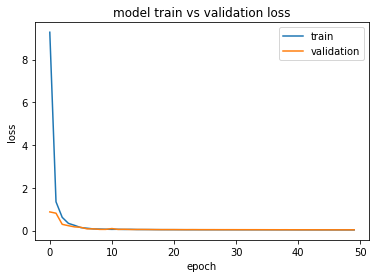

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.034503367


Text(0.5, 1.0, 'Cow 2')

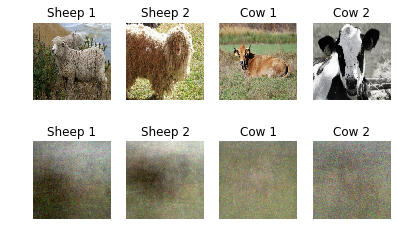

In [0]:
# Create an AE and fit it with the data using 153 neurons in the hidden layer (to compare with 153 PCs)
# --> fully-connected
# --> use linear activation function
input_dim = xscaled.shape[1] # size*size*3
encoding_dim = 153  
input_img = Input(shape=(input_dim,))
encoded = Dense(encoding_dim, activation='linear')(input_img)
decoded = Dense(input_dim, activation='linear')(encoded)
autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer='adam', loss='mse')
print(autoencoder.summary())

history = autoencoder.fit(xscaled, xscaled,
                epochs=50,
                batch_size=16,
                shuffle=True,
                validation_data=(xvscaled, xvscaled),
                verbose = 0)

# Plot the loss --> MSE
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model train vs validation loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()

# Use the encoded layer to encode the training input
encoder = Model(input_img, encoded)
encoded_input = Input(shape=(encoding_dim,))
decoder_layer = autoencoder.layers[-1]
decoder = Model(encoded_input, decoder_layer(encoded_input))
encoded_data = encoder.predict(xscaled)

decoded_data = autoencoder.predict(xscaled)
decoded_imgs = decoded_data.reshape(len(xtrain), len(xtrain[0]), len(xtrain[0,0]), len(xtrain[0,0,0]))

print(mean_squared_error(xrs,decoded_data))

# plot 2 "good" images of each class
pl.figure(1, figsize=(6.4, 4))

pl.subplot(2, 4, 1)
pl.imshow(xtrain[3])
pl.axis('off')
pl.title('Sheep 1')

pl.subplot(2, 4, 2)
pl.imshow(xtrain[1])
pl.axis('off')
pl.title('Sheep 2')

pl.subplot(2, 4, 3)
pl.imshow(xtrain[-1])
pl.axis('off')
pl.title('Cow 1')

pl.subplot(2, 4, 4)
pl.imshow(xtrain[-2])
pl.axis('off')
pl.title('Cow 2')

pl.subplot(2, 4, 5)
pl.imshow(decoded_imgs[3])
pl.axis('off')
pl.title('Sheep 1')

pl.subplot(2, 4, 6)
pl.imshow(decoded_imgs[1])
pl.axis('off')
pl.title('Sheep 2')

pl.subplot(2, 4, 7)
pl.imshow(decoded_imgs[-1])
pl.axis('off')
pl.title('Cow 1')

pl.subplot(2, 4, 8)
pl.imshow(decoded_imgs[-2])
pl.axis('off')
pl.title('Cow 2')

## Non linear and convolutional AE


### AE1


In [0]:
# AE1
# size code --> /4

input_img = Input(shape=(len(xtrain[0]),len(xtrain[0,0]),len(xtrain[0,0,0]))) 
# 196608 dimensions if 256
# 49152 if 128

net = Conv2D(16, (3, 3), activation='relu', padding='same')(input_img)
net = MaxPooling2D((2, 2), padding='same')(net)
net = Conv2D(8, (3, 3), activation='relu', padding='same')(net)
encoded = MaxPooling2D((2, 2), padding='same')(net)

# "code" layer: at this point the representation is 
  # (32, 32, 8) --> 8192 dimensions if 256
  # (16, 16, 8) --> 2018 if 128

net = Conv2D(8, (3, 3), activation='relu', padding='same')(encoded)
net = UpSampling2D((2, 2))(net)
net = Conv2D(16, (3, 3), activation='relu', padding='same')(net)
net = UpSampling2D((2, 2))(net)
decoded = Conv2D(3, (3, 3), activation='sigmoid', padding='same')(net)

autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer='adam', loss='mse')
print(autoencoder.summary())

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_9 (InputLayer)         (None, 256, 256, 3)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 256, 256, 16)      448       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 128, 128, 16)      0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 128, 128, 8)       1160      
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 64, 64, 8)         0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 64, 64, 8)         584       
_________________________________________________________________
up_sampling2d_1 (UpSampling2 (None, 128, 128, 8)       0         
__________

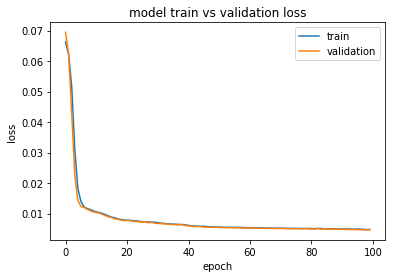

In [0]:
history = autoencoder.fit(xtrain, xtrain,
                epochs=100,
                batch_size=16,
                shuffle=True,
                validation_data=(xval, xval),
                         verbose=0)

# Plot the loss --> (binary cross-entropy) MSE
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model train vs validation loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()

0.004904986


Text(0.5, 1.0, 'Cow 2')

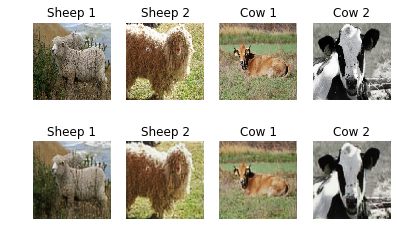

In [0]:
decoded_imgs = autoencoder.predict(xtrain)
decoded_rs = decoded_imgs.reshape(len(xtrain), len(xtrain[0])*len(xtrain[0,0])*len(xtrain[0,0,0]))

print(mean_squared_error(xrs,decoded_rs))

# plot 2 "good" images of each class
pl.figure(1, figsize=(6.4, 4))

pl.subplot(2, 4, 1)
pl.imshow(xtrain[3])
pl.axis('off')
pl.title('Sheep 1')

pl.subplot(2, 4, 2)
pl.imshow(xtrain[1])
pl.axis('off')
pl.title('Sheep 2')

pl.subplot(2, 4, 3)
pl.imshow(xtrain[-1])
pl.axis('off')
pl.title('Cow 1')

pl.subplot(2, 4, 4)
pl.imshow(xtrain[-2])
pl.axis('off')
pl.title('Cow 2')

pl.subplot(2, 4, 5)
pl.imshow(decoded_imgs[3])
pl.axis('off')
pl.title('Sheep 1')

pl.subplot(2, 4, 6)
pl.imshow(decoded_imgs[1])
pl.axis('off')
pl.title('Sheep 2')

pl.subplot(2, 4, 7)
pl.imshow(decoded_imgs[-1])
pl.axis('off')
pl.title('Cow 1')

pl.subplot(2, 4, 8)
pl.imshow(decoded_imgs[-2])
pl.axis('off')
pl.title('Cow 2')

Text(0.5, 1.0, 'Cow 2')

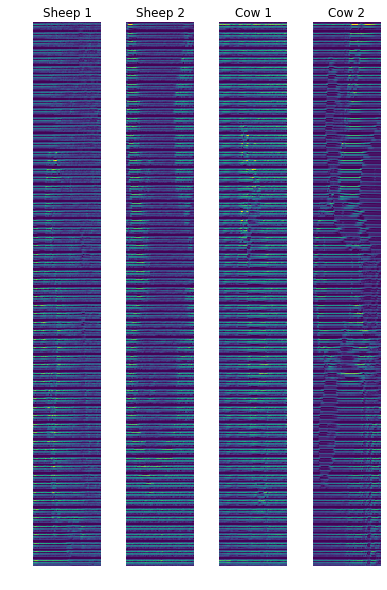

In [0]:
# Show encoded representations
encoder = Model(input_img, encoded)
encoded_imgs = encoder.predict(xtrain)
pl.figure(1, figsize=(6.4, 10))

s = int(len(xtrain[0])/4)

pl.subplot(1, 4, 1)
pl.imshow(encoded_imgs[3].reshape(s, s * 8).T)
pl.axis('off')
pl.title('Sheep 1')

pl.subplot(1, 4, 2)
pl.imshow(encoded_imgs[1].reshape(s, s * 8).T)
pl.axis('off')
pl.title('Sheep 2')

pl.subplot(1, 4, 3)
pl.imshow(encoded_imgs[-1].reshape(s, s * 8).T)
pl.axis('off')
pl.title('Cow 1')

pl.subplot(1, 4, 4)
pl.imshow(encoded_imgs[-2].reshape(s, s * 8).T)
pl.axis('off')
pl.title('Cow 2')

### AE2

In [0]:
# AE2
# size code --> /8

from keras.layers import Input, Dense, Conv2D, MaxPooling2D, UpSampling2D
from keras.models import Model
from keras import backend as K

input_img = Input(shape=(len(xtrain[0]),len(xtrain[0,0]),len(xtrain[0,0,0]))) 
# 196608 dimensions if 256
# 49152 if 128

net = Conv2D(16, (3, 3), activation='relu', padding='same')(input_img)
net = MaxPooling2D((2, 2), padding='same')(net)
net = Conv2D(8, (3, 3), activation='relu', padding='same')(net)
net = MaxPooling2D((2, 2), padding='same')(net)
net = Conv2D(8, (3, 3), activation='relu', padding='same')(net)
encoded = MaxPooling2D((2, 2), padding='same')(net)

# "code" layer: at this point the representation is 
  # (32, 32, 8) --> 8192 dimensions if 256
  # (16, 16, 8) --> 2018 if 128

net = Conv2D(8, (3, 3), activation='relu', padding='same')(encoded)
net = UpSampling2D((2, 2))(net)
net = Conv2D(8, (3, 3), activation='relu', padding='same')(net)
net = UpSampling2D((2, 2))(net)
net = Conv2D(16, (3, 3), activation='relu', padding='same')(net)
net = UpSampling2D((2, 2))(net)
decoded = Conv2D(3, (3, 3), activation='sigmoid', padding='same')(net)

autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer='adam', loss='mse')
print(autoencoder.summary())

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_10 (InputLayer)        (None, 256, 256, 3)       0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 256, 256, 16)      448       
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 128, 128, 16)      0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 128, 128, 8)       1160      
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 64, 64, 8)         0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 64, 64, 8)         584       
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 32, 32, 8)         0         
__________

Train on 153 samples, validate on 150 samples
Epoch 1/100
153/153 [==============================] - 1s 9ms/step - loss: 0.0660 - val_loss: 0.0695
Epoch 2/100
153/153 [==============================] - 1s 4ms/step - loss: 0.0629 - val_loss: 0.0632
Epoch 3/100
153/153 [==============================] - 1s 5ms/step - loss: 0.0530 - val_loss: 0.0464
Epoch 4/100
153/153 [==============================] - 1s 5ms/step - loss: 0.0356 - val_loss: 0.0297
Epoch 5/100
153/153 [==============================] - 1s 5ms/step - loss: 0.0265 - val_loss: 0.0240
Epoch 6/100
153/153 [==============================] - 1s 5ms/step - loss: 0.0229 - val_loss: 0.0220
Epoch 7/100
153/153 [==============================] - 1s 5ms/step - loss: 0.0208 - val_loss: 0.0201
Epoch 8/100
153/153 [==============================] - 1s 5ms/step - loss: 0.0191 - val_loss: 0.0182
Epoch 9/100
153/153 [==============================] - 1s 5ms/step - loss: 0.0175 - val_loss: 0.0172
Epoch 10/100
153/153 [=======================

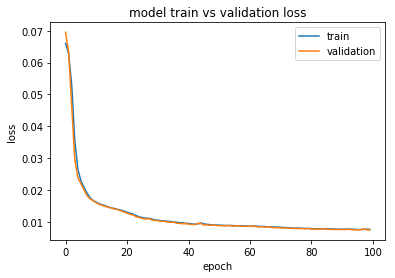

In [0]:
history = autoencoder.fit(xtrain, xtrain,
                epochs=100,
                batch_size=16,
                shuffle=True,
                validation_data=(xval, xval))

# Plot the loss --> (binary cross-entropy) MSE
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model train vs validation loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()

0.0075885984


Text(0.5, 1.0, 'Cow 2')

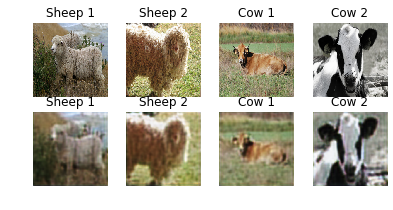

In [0]:
decoded_imgs = autoencoder.predict(xtrain)
decoded_rs = decoded_imgs.reshape(len(xtrain), len(xtrain[0])*len(xtrain[0,0])*len(xtrain[0,0,0]))

print(mean_squared_error(xrs,decoded_rs))

pl.figure(1, figsize=(6.4, 3))

# plot 2 "good" images of each class
pl.figure(1, figsize=(6.4, 4))

pl.subplot(2, 4, 1)
pl.imshow(xtrain[3])
pl.axis('off')
pl.title('Sheep 1')

pl.subplot(2, 4, 2)
pl.imshow(xtrain[1])
pl.axis('off')
pl.title('Sheep 2')

pl.subplot(2, 4, 3)
pl.imshow(xtrain[-1])
pl.axis('off')
pl.title('Cow 1')

pl.subplot(2, 4, 4)
pl.imshow(xtrain[-2])
pl.axis('off')
pl.title('Cow 2')

pl.subplot(2, 4, 5)
pl.imshow(decoded_imgs[3])
pl.axis('off')
pl.title('Sheep 1')

pl.subplot(2, 4, 6)
pl.imshow(decoded_imgs[1])
pl.axis('off')
pl.title('Sheep 2')

pl.subplot(2, 4, 7)
pl.imshow(decoded_imgs[-1])
pl.axis('off')
pl.title('Cow 1')

pl.subplot(2, 4, 8)
pl.imshow(decoded_imgs[-2])
pl.axis('off')
pl.title('Cow 2')

Text(0.5, 1.0, 'Cow 2')

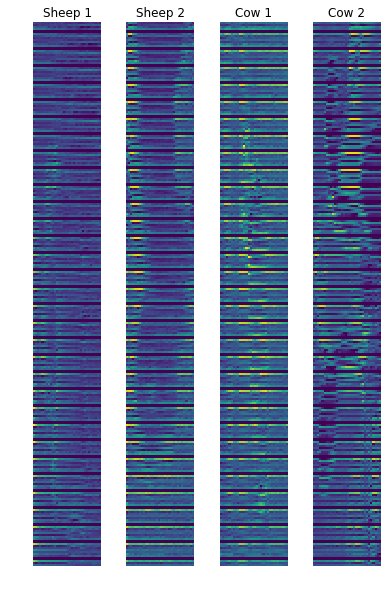

In [0]:
# Show encoded representations
encoder = Model(input_img, encoded)
encoded_imgs = encoder.predict(xtrain)
pl.figure(1, figsize=(6.4, 10))

s = int(len(xtrain[0])/8)

pl.subplot(1, 4, 1)
pl.imshow(encoded_imgs[3].reshape(s, s * 8).T)
pl.axis('off')
pl.title('Sheep 1')

pl.subplot(1, 4, 2)
pl.imshow(encoded_imgs[1].reshape(s, s * 8).T)
pl.axis('off')
pl.title('Sheep 2')

pl.subplot(1, 4, 3)
pl.imshow(encoded_imgs[-1].reshape(s, s * 8).T)
pl.axis('off')
pl.title('Cow 1')

pl.subplot(1, 4, 4)
pl.imshow(encoded_imgs[-2].reshape(s, s * 8).T)
pl.axis('off')
pl.title('Cow 2')

### AE3

In [0]:
# AE3
# size code --> /16

from keras.layers import Input, Dense, Conv2D, MaxPooling2D, UpSampling2D
from keras.models import Model
from keras import backend as K

input_img = Input(shape=(len(xtrain[0]),len(xtrain[0,0]),len(xtrain[0,0,0]))) 
# 196608 dimensions if 256
# 49152 if 128

net = Conv2D(16, (3, 3), activation='relu', padding='same')(input_img)
net = MaxPooling2D((2, 2), padding='same')(net)
net = Conv2D(8, (3, 3), activation='relu', padding='same')(net)
net = MaxPooling2D((2, 2), padding='same')(net)
net = Conv2D(8, (3, 3), activation='relu', padding='same')(net)
net = MaxPooling2D((2, 2), padding='same')(net)
net = Conv2D(8, (3, 3), activation='relu', padding='same')(net)
encoded = MaxPooling2D((2, 2), padding='same')(net)

# "code" layer: at this point the representation is 
  # (32, 32, 8) --> 8192 dimensions if 256
  # (16, 16, 8) --> 2018 if 128

net = Conv2D(8, (3, 3), activation='relu', padding='same')(encoded)
net = UpSampling2D((2, 2))(net)
net = Conv2D(8, (3, 3), activation='relu', padding='same')(net)
net = UpSampling2D((2, 2))(net)
net = Conv2D(8, (3, 3), activation='relu', padding='same')(net)
net = UpSampling2D((2, 2))(net)
net = Conv2D(16, (3, 3), activation='relu', padding='same')(net)
net = UpSampling2D((2, 2))(net)
decoded = Conv2D(3, (3, 3), activation='sigmoid', padding='same')(net)

autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer='adam', loss='mse')
print(autoencoder.summary())

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_11 (InputLayer)        (None, 256, 256, 3)       0         
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 256, 256, 16)      448       
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 128, 128, 16)      0         
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 128, 128, 8)       1160      
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 64, 64, 8)         0         
_________________________________________________________________
conv2d_15 (Conv2D)           (None, 64, 64, 8)         584       
_________________________________________________________________
max_pooling2d_8 (MaxPooling2 (None, 32, 32, 8)         0         
__________

Train on 153 samples, validate on 150 samples
Epoch 1/100
153/153 [==============================] - 2s 11ms/step - loss: 0.0654 - val_loss: 0.0669
Epoch 2/100
153/153 [==============================] - 1s 5ms/step - loss: 0.0586 - val_loss: 0.0577
Epoch 3/100
153/153 [==============================] - 1s 5ms/step - loss: 0.0497 - val_loss: 0.0482
Epoch 4/100
153/153 [==============================] - 1s 5ms/step - loss: 0.0429 - val_loss: 0.0428
Epoch 5/100
153/153 [==============================] - 1s 5ms/step - loss: 0.0395 - val_loss: 0.0403
Epoch 6/100
153/153 [==============================] - 1s 5ms/step - loss: 0.0376 - val_loss: 0.0390
Epoch 7/100
153/153 [==============================] - 1s 5ms/step - loss: 0.0365 - val_loss: 0.0370
Epoch 8/100
153/153 [==============================] - 1s 5ms/step - loss: 0.0346 - val_loss: 0.0343
Epoch 9/100
153/153 [==============================] - 1s 5ms/step - loss: 0.0307 - val_loss: 0.0277
Epoch 10/100
153/153 [======================

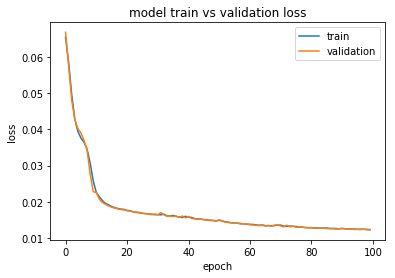

In [0]:
history = autoencoder.fit(xtrain, xtrain,
                epochs=100,
                batch_size=16,
                shuffle=True,
                validation_data=(xval, xval))

# Plot the loss --> (binary cross-entropy) MSE
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model train vs validation loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()

Relu, Linear, And Sigmoid --> all val_loss = 0.017 after 300 epochs (with adam)

SGD (with sigmoid) --> val_loss = 0.045 after 300 epochs (and reconstructed images very bad) => keep adam 

0.012285776


Text(0.5, 1.0, 'Cow 2')

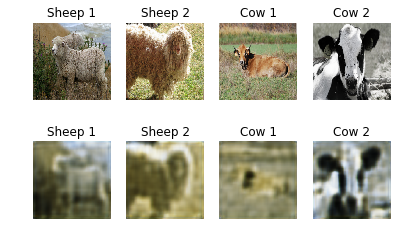

In [0]:
decoded_imgs = autoencoder.predict(xtrain)
decoded_rs = decoded_imgs.reshape(len(xtrain), len(xtrain[0])*len(xtrain[0,0])*len(xtrain[0,0,0]))

print(mean_squared_error(xrs,decoded_rs))

# plot 2 "good" images of each class
pl.figure(1, figsize=(6.4, 4))

pl.subplot(2, 4, 1)
pl.imshow(xtrain[3])
pl.axis('off')
pl.title('Sheep 1')

pl.subplot(2, 4, 2)
pl.imshow(xtrain[1])
pl.axis('off')
pl.title('Sheep 2')

pl.subplot(2, 4, 3)
pl.imshow(xtrain[-1])
pl.axis('off')
pl.title('Cow 1')

pl.subplot(2, 4, 4)
pl.imshow(xtrain[-2])
pl.axis('off')
pl.title('Cow 2')

pl.subplot(2, 4, 5)
pl.imshow(decoded_imgs[3])
pl.axis('off')
pl.title('Sheep 1')

pl.subplot(2, 4, 6)
pl.imshow(decoded_imgs[1])
pl.axis('off')
pl.title('Sheep 2')

pl.subplot(2, 4, 7)
pl.imshow(decoded_imgs[-1])
pl.axis('off')
pl.title('Cow 1')

pl.subplot(2, 4, 8)
pl.imshow(decoded_imgs[-2])
pl.axis('off')
pl.title('Cow 2')

reconstruction worse than with AE1 / AE2 (and AE2 worse than AE1)

Manu: for them worse too, but prof said should be better

--> why? smaller = more bottleneck = more info lost ??


Text(0.5, 1.0, 'Cow 2')

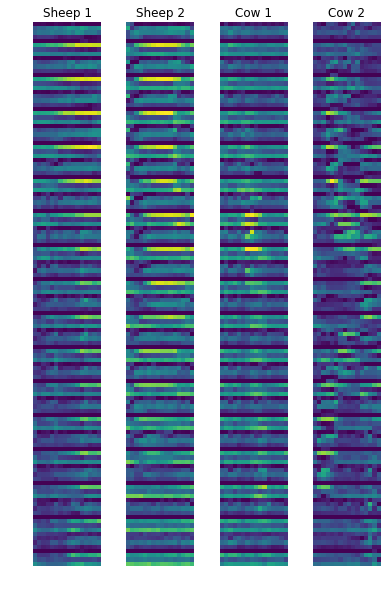

In [0]:
# Show encoded representations
encoder = Model(input_img, encoded)
encoded_imgs = encoder.predict(xtrain)
pl.figure(1, figsize=(6.4, 10))

s = int(len(xtrain[0])/16)

pl.subplot(1, 4, 1)
pl.imshow(encoded_imgs[3].reshape(s, s * 8).T)
pl.axis('off')
pl.title('Sheep 1')

pl.subplot(1, 4, 2)
pl.imshow(encoded_imgs[1].reshape(s, s * 8).T)
pl.axis('off')
pl.title('Sheep 2')

pl.subplot(1, 4, 3)
pl.imshow(encoded_imgs[-1].reshape(s, s * 8).T)
pl.axis('off')
pl.title('Cow 1')

pl.subplot(1, 4, 4)
pl.imshow(encoded_imgs[-2].reshape(s, s * 8).T)
pl.axis('off')
pl.title('Cow 2')

### To do

TO DO if we want: greedy layer-wise training (see ANN exercise session 3)

1) Train 1st layer as AE with 1 hidden layer

2) Predict encoder part with training data 
          
          features = encoder.predict(xtrain)
          
3) Train 2nd layer as AE with 1 hidden layer, and use features as input

4) Predict encoder part

5) Train 3rd layer as AE with 1 hidden layer, and use features obtained in step 4

etc.


Manu: should achieve very good accuracy (for classification (?))

# Classification


In [0]:
# AE1
# size code --> /4

input_img = Input(shape=(len(xtrain[0]),len(xtrain[0,0]),len(xtrain[0,0,0]))) 
# 196608 dimensions if 256
# 49152 if 128

net = Conv2D(16, (3, 3), activation='relu', padding='same')(input_img)
net = MaxPooling2D((2, 2), padding='same')(net)
net = Conv2D(8, (3, 3), activation='relu', padding='same')(net)
net = MaxPooling2D((2, 2), padding='same')(net)
net = Conv2D(8, (3, 3), activation='relu', padding='same')(net)
encoded = MaxPooling2D((2, 2), padding='same')(net)

# "code" layer: at this point the representation is 
  # (32, 32, 8) --> 8192 dimensions if 256
  # (16, 16, 8) --> 2018 if 128

net = Conv2D(8, (3, 3), activation='relu', padding='same')(encoded)
net = UpSampling2D((2, 2))(net)
net = Conv2D(8, (3, 3), activation='relu', padding='same')(net)
net = UpSampling2D((2, 2))(net)
net = Conv2D(16, (3, 3), activation='relu', padding='same')(net)
net = UpSampling2D((2, 2))(net)
decoded = Conv2D(3, (3, 3), activation='sigmoid', padding='same')(net)

autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer='adam', loss='mse')

history = autoencoder.fit(xtrain, xtrain,
                epochs=100,
                batch_size=16,
                shuffle=True,
                validation_data=(xval, xval),
                verbose=0)



# 
encoder = Model(input_img, encoded)
encoded_imgs = encoder.predict(xtrain)
encoder.save(path+'AE1model.h5')
encoder.save_weights(path+'AE1weights.h5')


In [0]:
encoder_frozen = load_model(path+'AE1model.h5')
for layer in encoder_frozen.layers:
  layer.trainable = False
print(encoder_frozen.summary())

In [0]:


encoder_frozen

net = Flatten()(encoded) # (16, 16, 8) --> 2048     (32, 32, 8) --> 8192
N = int(len(xtrain[0])/8 * len(xtrain[0,0])/8 * 8)
net = Dense(N, activation='relu')(net)
classOut = Dense(2, activation='softmax')(net) #  simple logistic regression

In [0]:
autoencoder = Model(input_img, classOut)
autoencoder.compile(optimizer='adam', loss='mse')

history = autoencoder.fit(xtrain, ytrain,
                epochs=10,
                batch_size=16,
                shuffle=True,
                validation_data=(xval, yval))

In [0]:
score = autoencoder.evaluate(xval, yval, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

# Image Segmentation


## load and plot


In [0]:
# load matrices
#xtrain = np.load(path+'x_train_seg_cow-sheep.npy') #taille 256 #all in 128
#xval = np.load(path+'x_val_seg_cow-sheep.npy')
#yval = np.load(path+'y_val_seg_cow-sheep.npy')
#ytrain = np.load(path+'y_train_seg_cow-sheep.npy')

xtrain = np.load(path+'x_train_seg_all224.npy') #taille 256 #all in 128
xval = np.load(path+'x_val_seg_all224.npy')
yval = np.load(path+'y_val_seg_all224.npy')
ytrain = np.load(path+'y_train_seg_all224.npy')

(-0.5, 223.5, 223.5, -0.5)

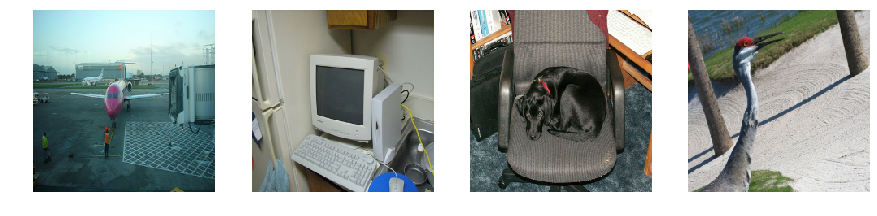

In [0]:
# plot 2 "good" images of each class
ratio = 15
pl.figure(1, figsize=(1*ratio, 4*ratio))

pl.subplot(1, 4, 1)
pl.imshow(xtrain[0])
pl.axis('off')
#pl.title('Sheep 1')

pl.subplot(1, 4, 2)
pl.imshow(xtrain[1])
pl.axis('off')
#pl.title('Sheep 2')

pl.subplot(1, 4, 3)
pl.imshow(xtrain[2])
pl.axis('off')
#pl.title('Cow 1')

pl.subplot(1, 4, 4)
pl.imshow(xtrain[3])
pl.axis('off')
#pl.title('Cow 2')

(749, 224, 224, 3)
(750, 224, 224, 3)


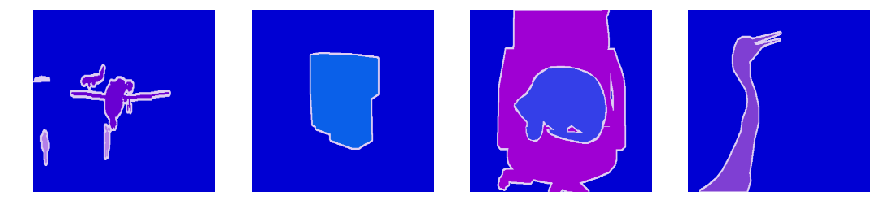

In [0]:
# plot 2 "good" images of each class
ratio = 15
pl.figure(1, figsize=(1*ratio, 4*ratio))

pl.subplot(1, 4, 1)
pl.imshow(ytrain[0])
pl.axis('off')
#pl.title('Sheep 1')

pl.subplot(1, 4, 2)
pl.imshow(ytrain[1])
pl.axis('off')
#pl.title('Sheep 2')

pl.subplot(1, 4, 3)
pl.imshow(ytrain[2])
pl.axis('off')
#pl.title('Cow 1')

pl.subplot(1, 4, 4)
pl.imshow(ytrain[3])
pl.axis('off')
#pl.title('Cow 2')

print(ytrain.shape)
print(yval.shape)

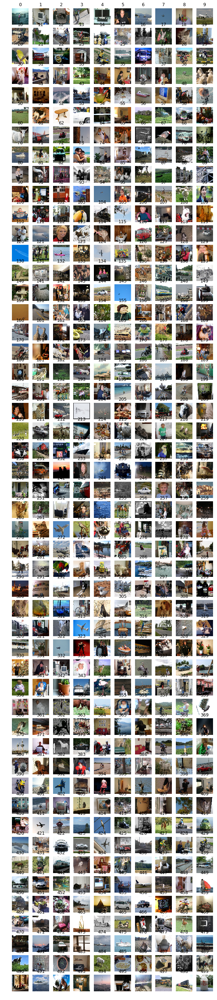

In [0]:
#plot whole training set
pl.figure(1, figsize=(10, 50))
for i in range(500):
    pl.subplot(50, 10, i+1)
    pl.imshow(xtrain[i])
    pl.axis('off')
    pl.title(str(i))

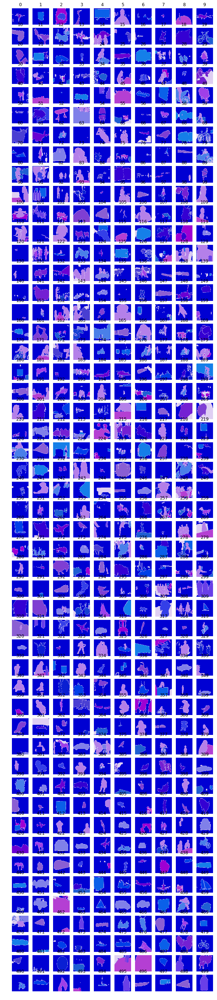

In [0]:
# plot whole training set segmentation
pl.figure(1, figsize=(10, 50))
for i in range(500):
    pl.subplot(50, 10, i+1)
    pl.imshow(ytrain[i])
    pl.axis('off')
    pl.title(str(i))

In [0]:
a = np.array([[9, 8, 7],[6, 5, 4],[3, 2, 1]])

print(np.sort(a, axis = 0))

[[3 2 1]
 [6 5 4]
 [9 8 7]]


In [0]:
size = 25
tuner = 21
myColors = np.zeros((size,3))
counter = 0

for i in range(len(ytrain)):
  for j in range(20):
    for k in range(20):
      
      A = np.around(ytrain[i][j][k]*tuner)
      inColors = False
      
      for row in range(21):
        if np.array_equal(A,myColors[row]):
          inColors = True

      if not inColors and counter < size: 
        #print(ytrain[i][j][k]*255)
        myColors[counter] = np.around(ytrain[i][j][k]*tuner)
        counter += 1
        print(counter)
        
        
print(myColors)

#print(np.sort(myColors,axis=0))

mat_sort = myColors[myColors[:,0].argsort()]

print(mat_sort)
        

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
[[ 0.  0. 17.]
 [ 6.  6. 18.]
 [18. 17. 20.]
 [ 2.  1. 18.]
 [17. 16. 20.]
 [16. 16. 20.]
 [ 5. 10. 19.]
 [15. 16. 20.]
 [ 1.  8. 19.]
 [ 3.  3. 18.]
 [ 7.  6. 18.]
 [ 6.  5. 18.]
 [ 1.  1. 18.]
 [ 2.  2. 18.]
 [16. 14. 20.]
 [11. 10. 19.]
 [11. 11. 19.]
 [16. 15. 20.]
 [10. 10. 19.]
 [18. 16. 20.]
 [12. 11. 19.]
 [ 7.  7. 18.]
 [ 6.  7. 18.]
 [14. 13. 19.]
 [ 4.  5. 18.]]
[[ 0.  0. 17.]
 [ 1.  8. 19.]
 [ 1.  1. 18.]
 [ 2.  1. 18.]
 [ 2.  2. 18.]
 [ 3.  3. 18.]
 [ 4.  5. 18.]
 [ 5. 10. 19.]
 [ 6.  6. 18.]
 [ 6.  5. 18.]
 [ 6.  7. 18.]
 [ 7.  6. 18.]
 [ 7.  7. 18.]
 [10. 10. 19.]
 [11. 10. 19.]
 [11. 11. 19.]
 [12. 11. 19.]
 [14. 13. 19.]
 [15. 16. 20.]
 [16. 16. 20.]
 [16. 15. 20.]
 [16. 14. 20.]
 [17. 16. 20.]
 [18. 17. 20.]
 [18. 16. 20.]]


In [0]:
print(myColors)

#print(np.sort(myColors,axis=0))

mat_sort = myColors[myColors[:,0].argsort()]

print(mat_sort)

[[0. 0. 4.]
 [2. 1. 4.]
 [4. 4. 5.]
 [1. 2. 5.]
 [0. 2. 5.]
 [1. 1. 4.]
 [2. 2. 4.]
 [4. 3. 5.]
 [3. 2. 5.]
 [3. 3. 5.]
 [1. 2. 4.]
 [0. 1. 4.]
 [1. 0. 4.]
 [3. 4. 5.]
 [1. 3. 5.]
 [0. 3. 5.]
 [2. 2. 5.]
 [2. 3. 5.]
 [0. 1. 5.]
 [3. 3. 4.]
 [3. 2. 4.]
 [4. 1. 4.]
 [4. 2. 4.]
 [3. 0. 4.]
 [4. 2. 4.]]
[[0. 0. 4.]
 [0. 1. 5.]
 [0. 3. 5.]
 [0. 2. 5.]
 [0. 1. 4.]
 [1. 3. 5.]
 [1. 2. 4.]
 [1. 0. 4.]
 [1. 1. 4.]
 [1. 2. 5.]
 [2. 2. 5.]
 [2. 2. 4.]
 [2. 1. 4.]
 [2. 3. 5.]
 [3. 2. 4.]
 [3. 3. 4.]
 [3. 2. 5.]
 [3. 4. 5.]
 [3. 0. 4.]
 [3. 3. 5.]
 [4. 4. 5.]
 [4. 1. 4.]
 [4. 2. 4.]
 [4. 3. 5.]
 [4. 2. 4.]]


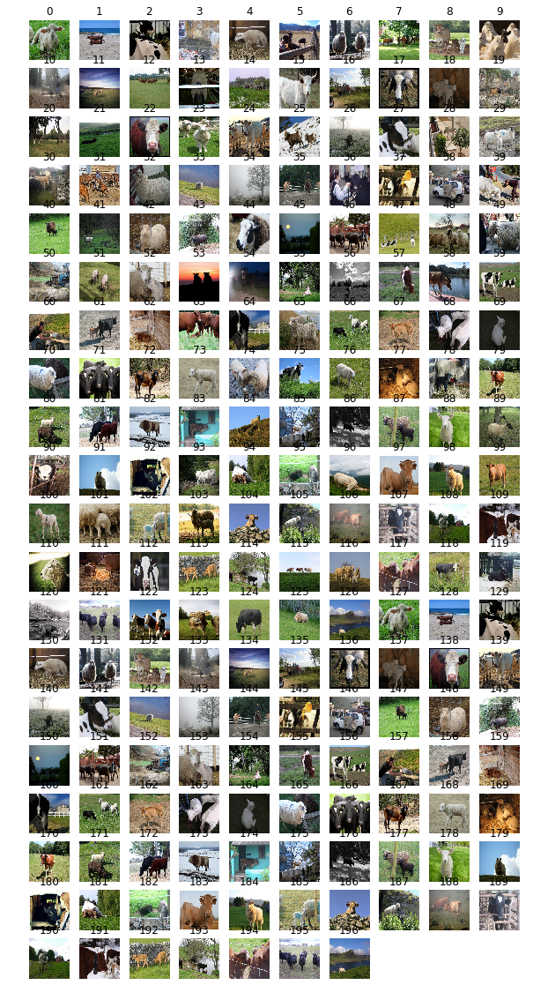

In [0]:
# plot whole validation set
pl.figure(1, figsize=(10, 20))
for i in range(len(xval)):
    pl.subplot(20, 10, i+1)
    pl.imshow(xval[i])
    pl.axis('off')
    pl.title(str(i))

In [0]:
# plot whole validation set segmentation
pl.figure(1, figsize=(10, 20))
for i in range(len(yval)):
    pl.subplot(20, 10, i+1)
    pl.imshow(yval[i])
    pl.axis('off')
    pl.title(str(i))

NameError: ignored

In [0]:
for i in range(244):
  

## Image segmentation with FCN

Fully convolutional networks for semantic segmentation

In [0]:
# preprocess segmentation to binary images

ytrain_bin = np.zeros((ytrain.shape[0],ytrain.shape[1],ytrain.shape[2],2))
ytrain_bin_plot = np.zeros((ytrain.shape[0],ytrain.shape[1],ytrain.shape[2]))
yval_bin = np.zeros((yval.shape[0],yval.shape[1],yval.shape[2],2))
yval_bin_plot = np.zeros((yval.shape[0],yval.shape[1],yval.shape[2]))

for i in range(ytrain.shape[0]):
  for j in range(ytrain.shape[1]):
    for k in range(ytrain.shape[2]):
      if ytrain[i][j][k][0] ==  0.0 and ytrain[i][j][k][1] ==  0.0: 
        ytrain_bin[i][j][k] = [1, 0]
        ytrain_bin_plot[i][j][k] = 1
      else:
        ytrain_bin[i][j][k] = [0, 1]
        
for i in range(yval.shape[0]):
  for j in range(yval.shape[1]):
    for k in range(yval.shape[2]):
      if yval[i][j][k][0] ==  0.0 and yval[i][j][k][1] ==  0.0: 
        yval_bin[i][j][k] = [1, 0]
        yval_bin_plot[i][j][k] = 1
      else:
        yval_bin[i][j][k] = [0, 1]
          
          
        

In [0]:
np.save(path+"ytrain_bin.npy", ytrain_bin)
np.save(path+"yval_bin.npy", yval_bin)

In [0]:
np.save(path+"ytrain_bin_plot.npy", ytrain_bin_plot)
np.save(path+"yval_bin_plot.npy", yval_bin_plot)

In [0]:
ytrain_bin = np.load(path+'ytrain_bin.npy')
yval_bin = np.load(path+'yval_bin.npy')

NameError: ignored

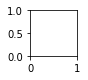

In [0]:
pl.figure(1, figsize=(10, 50))
for i in range(500):
    pl.subplot(50, 10, i+1)
    pl.imshow(ytrain_bin_plot[i])
    pl.axis('off')
    pl.title(str(i))

(-0.5, 223.5, 223.5, -0.5)

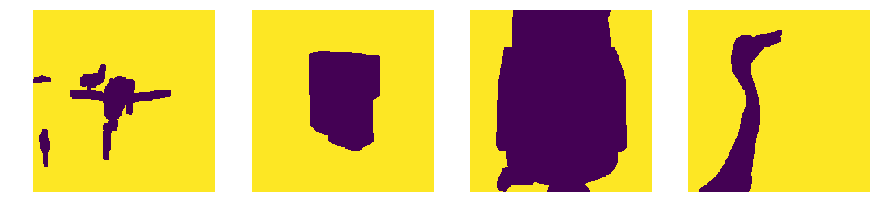

In [0]:
ratio = 15
pl.figure(1, figsize=(1*ratio, 4*ratio))

pl.subplot(1, 4, 1)
pl.imshow(ytrain_bin_plot[0])
pl.axis('off')
#pl.title('Sheep 1')

pl.subplot(1, 4, 2)
pl.imshow(ytrain_bin_plot[1])
pl.axis('off')
#pl.title('Sheep 2')

pl.subplot(1, 4, 3)
pl.imshow(ytrain_bin_plot[2])
pl.axis('off')
#pl.title('Cow 1')

pl.subplot(1, 4, 4)
pl.imshow(ytrain_bin_plot[3])
pl.axis('off')
#pl.title('Cow 2')

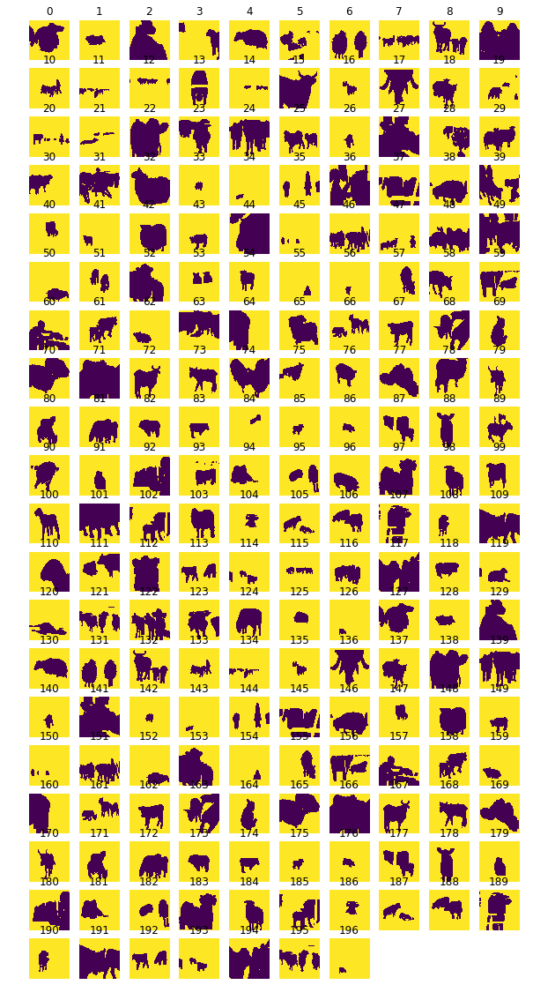

In [0]:
pl.figure(1, figsize=(10, 50))
for i in range(500):
    pl.subplot(50, 10, i+1)
    pl.imshow(yval_bin_plot[i])
    pl.axis('off')
    pl.title(str(i))

## FCN model

In [0]:
## Import usual libraries
import tensorflow as tf
from keras.backend.tensorflow_backend import set_session
import keras, sys, time, warnings
from keras.models import *
from keras.layers import *
import pandas as pd 
warnings.filterwarnings("ignore")

#os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID" 
#config = tf.ConfigProto()
#config.gpu_options.per_process_gpu_memory_fraction = 0.95
#config.gpu_options.visible_device_list = "2" 
#set_session(tf.Session(config=config))   

print("python {}".format(sys.version))
print("keras version {}".format(keras.__version__)); del keras
print("tensorflow version {}".format(tf.__version__))

python 3.6.7 (default, Oct 22 2018, 11:32:17) 
[GCC 8.2.0]
keras version 2.2.4
tensorflow version 1.14.0-rc1


In [0]:
## location of VGG weights
VGG_Weights_path = path + "vgg16_weights_tf_dim_ordering_tf_kernels_notop.h5"

In [0]:
def FCN8( nClasses ,  input_height=224, input_width=224):
    ## input_height and width must be devisible by 32 because maxpooling with filter size = (2,2) is operated 5 times,
    ## which makes the input_height and width 2^5 = 32 times smaller
    assert input_height%32 == 0
    assert input_width%32 == 0
    IMAGE_ORDERING =  "channels_last" 

    img_input = Input(shape=(input_height,input_width, 3)) ## Assume 224,224,3
    
    ## Block 1
    x = Conv2D(64, (3, 3), activation='relu', padding='same', name='block1_conv1', data_format=IMAGE_ORDERING )(img_input)
    x = Conv2D(64, (3, 3), activation='relu', padding='same', name='block1_conv2', data_format=IMAGE_ORDERING )(x)
    x = MaxPooling2D((2, 2), strides=(2, 2), name='block1_pool', data_format=IMAGE_ORDERING )(x)
    f1 = x
    
    # Block 2
    x = Conv2D(128, (3, 3), activation='relu', padding='same', name='block2_conv1', data_format=IMAGE_ORDERING )(x)
    x = Conv2D(128, (3, 3), activation='relu', padding='same', name='block2_conv2', data_format=IMAGE_ORDERING )(x)
    x = MaxPooling2D((2, 2), strides=(2, 2), name='block2_pool', data_format=IMAGE_ORDERING )(x)
    f2 = x

    # Block 3
    x = Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv1', data_format=IMAGE_ORDERING )(x)
    x = Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv2', data_format=IMAGE_ORDERING )(x)
    x = Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv3', data_format=IMAGE_ORDERING )(x)
    x = MaxPooling2D((2, 2), strides=(2, 2), name='block3_pool', data_format=IMAGE_ORDERING )(x)
    pool3 = x

    # Block 4
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv1', data_format=IMAGE_ORDERING )(x)
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv2', data_format=IMAGE_ORDERING )(x)
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv3', data_format=IMAGE_ORDERING )(x)
    pool4 = MaxPooling2D((2, 2), strides=(2, 2), name='block4_pool', data_format=IMAGE_ORDERING )(x)## (None, 14, 14, 512) 

    # Block 5
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv1', data_format=IMAGE_ORDERING )(pool4)
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv2', data_format=IMAGE_ORDERING )(x)
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv3', data_format=IMAGE_ORDERING )(x)
    pool5 = MaxPooling2D((2, 2), strides=(2, 2), name='block5_pool', data_format=IMAGE_ORDERING )(x)## (None, 7, 7, 512)

    #x = Flatten(name='flatten')(x)
    #x = Dense(4096, activation='relu', name='fc1')(x)
    # <--> o = ( Conv2D( 4096 , ( 7 , 7 ) , activation='relu' , padding='same', data_format=IMAGE_ORDERING))(o)
    # assuming that the input_height = input_width = 224 as in VGG data
    
    #x = Dense(4096, activation='relu', name='fc2')(x)
    # <--> o = ( Conv2D( 4096 , ( 1 , 1 ) , activation='relu' , padding='same', data_format=IMAGE_ORDERING))(o)   
    # assuming that the input_height = input_width = 224 as in VGG data
    
    #x = Dense(1000 , activation='softmax', name='predictions')(x)
    # <--> o = ( Conv2D( nClasses ,  ( 1 , 1 ) ,kernel_initializer='he_normal' , data_format=IMAGE_ORDERING))(o)
    # assuming that the input_height = input_width = 224 as in VGG data
    
    
    vgg  = Model(  img_input , pool5  )
    vgg.load_weights(VGG_Weights_path) ## loading VGG weights for the encoder parts of FCN8
    
    n = 4096
    o = ( Conv2D( n , ( 7 , 7 ) , activation='relu' , padding='same', name="conv6", data_format=IMAGE_ORDERING))(pool5)
    conv7 = ( Conv2D( n , ( 1 , 1 ) , activation='relu' , padding='same', name="conv7", data_format=IMAGE_ORDERING))(o)
    
    
    ## 4 times upsamping for pool4 layer
    conv7_4 = Conv2DTranspose( nClasses , kernel_size=(4,4) ,  strides=(4,4) , use_bias=False, data_format=IMAGE_ORDERING )(conv7)
    ## (None, 224, 224, 10)
    ## 2 times upsampling for pool411
    pool411 = ( Conv2D( nClasses , ( 1 , 1 ) , activation='relu' , padding='same', name="pool4_11", data_format=IMAGE_ORDERING))(pool4)
    pool411_2 = (Conv2DTranspose( nClasses , kernel_size=(2,2) ,  strides=(2,2) , use_bias=False, data_format=IMAGE_ORDERING ))(pool411)
    
    pool311 = ( Conv2D( nClasses , ( 1 , 1 ) , activation='relu' , padding='same', name="pool3_11", data_format=IMAGE_ORDERING))(pool3)
        
    o = Add(name="add")([pool411_2, pool311, conv7_4 ])
    o = Conv2DTranspose( nClasses , kernel_size=(8,8) ,  strides=(8,8) , use_bias=False, data_format=IMAGE_ORDERING )(o)
    o = (Activation('softmax'))(o)
    
    model = Model(img_input, o)

    return model

n_classes = 2;
  
model = FCN8(nClasses     = n_classes,  
             input_height = 224, 
             input_width  = 224)
model.summary()

#plot_model(model, to_file=path+'FCN8.png', show_shapes=True)

W0618 14:20:20.012540 139718203119488 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:74: The name tf.get_default_graph is deprecated. Please use tf.compat.v1.get_default_graph instead.

W0618 14:20:20.082740 139718203119488 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:517: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.

W0618 14:20:20.112725 139718203119488 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:4138: The name tf.random_uniform is deprecated. Please use tf.random.uniform instead.

W0618 14:20:20.168154 139718203119488 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:3976: The name tf.nn.max_pool is deprecated. Please use tf.nn.max_pool2d instead.

W0618 14:20:20.713078 139718203119488 deprecation_wrapp

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 224, 224, 3)  0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 224, 224, 64) 1792        input_1[0][0]                    
__________________________________________________________________________________________________
block1_conv2 (Conv2D)           (None, 224, 224, 64) 36928       block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_pool (MaxPooling2D)      (None, 112, 112, 64) 0           block1_conv2[0][0]               
__________________________________________________________________________________________________
block2_con

In [0]:
from keras import optimizers

epochs_n = 100 #50 #200

sgd = optimizers.SGD(lr=1E-2, decay=5**(-4), momentum=0.9, nesterov=True)
model.compile(loss='categorical_crossentropy', #categorical_crossentropy binary_crossentropy
              optimizer=sgd, #sgd
              metrics=['accuracy'])

hist1 = model.fit(xtrain,ytrain_bin,
                  validation_data=(xval,yval_bin),
                  batch_size=32,epochs=epochs_n,verbose=2)

Train on 749 samples, validate on 750 samples
Epoch 1/100
 - 60s - loss: 0.5002 - acc: 0.7566 - val_loss: 0.5045 - val_acc: 0.7527
Epoch 2/100
 - 56s - loss: 0.4907 - acc: 0.7592 - val_loss: 0.4895 - val_acc: 0.7550
Epoch 3/100
 - 57s - loss: 0.4844 - acc: 0.7607 - val_loss: 0.4853 - val_acc: 0.7596
Epoch 4/100
 - 57s - loss: 0.4784 - acc: 0.7638 - val_loss: 0.5200 - val_acc: 0.7427
Epoch 5/100
 - 56s - loss: 0.4803 - acc: 0.7623 - val_loss: 0.4863 - val_acc: 0.7583
Epoch 6/100
 - 57s - loss: 0.4734 - acc: 0.7667 - val_loss: 0.4920 - val_acc: 0.7575
Epoch 7/100
 - 56s - loss: 0.4697 - acc: 0.7674 - val_loss: 0.4700 - val_acc: 0.7656
Epoch 8/100
 - 57s - loss: 0.4635 - acc: 0.7709 - val_loss: 0.4691 - val_acc: 0.7653
Epoch 9/100
 - 57s - loss: 0.4647 - acc: 0.7696 - val_loss: 0.4673 - val_acc: 0.7667
Epoch 10/100
 - 57s - loss: 0.4629 - acc: 0.7710 - val_loss: 0.4749 - val_acc: 0.7662
Epoch 11/100
 - 57s - loss: 0.4612 - acc: 0.7724 - val_loss: 0.4695 - val_acc: 0.7651
Epoch 12/100
 - 5

In [0]:
#model.save(path+'myFCN8_model.h5')
#model.save_weights(path+'myFCN8_weights.h5')

In [0]:
from keras.models import load_model
myFCN8_200 = load_model(path+'myFCN8_model.h5')

In [0]:
model = myFCN8_200

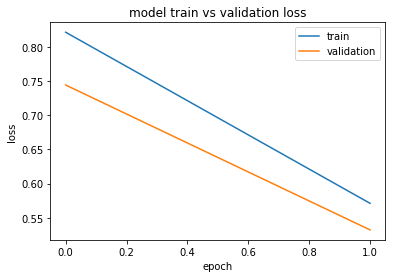

In [0]:
# Plot the loss --> MSE
plt.plot(hist1.history['loss'])
plt.plot(hist1.history['val_loss'])
plt.title('model train vs validation loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()

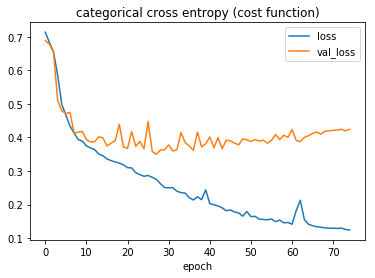

In [0]:
for key in ['loss', 'val_loss']:
    plt.plot(hist1.history[key],label=key)
    plt.title("categorical cross entropy (cost function)")
    plt.xlabel('epoch')
plt.legend()
plt.show()

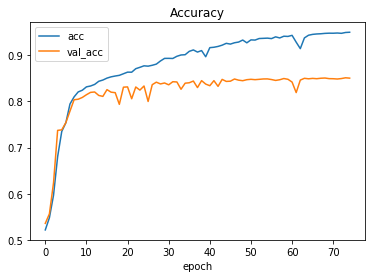

In [0]:
for key in ['acc', 'val_acc']:
    plt.plot(hist1.history[key],label=key)
    plt.title("Accuracy")
    plt.xlabel('epoch')
plt.legend()
plt.show()

In [0]:
y_pred = model.predict(xval)
y_predi = np.argmax(y_pred, axis=3)
y_vali = np.argmax(yval_bin, axis=3)
#y_predi = np.argmin(y_pred, axis=3)
#y_vali = np.argmin(yval_bin, axis=3)
print(y_vali.shape,y_predi.shape)

print(y_vali[0][112][0:10])
print(y_predi[0][112][0:10])

(750, 224, 224) (750, 224, 224)
[0 0 0 0 0 1 1 1 1 1]
[1 1 1 1 1 1 1 1 1 1]


In [0]:
print(y_vali[0][112][0:50])
print(y_predi[0][112][0:50])

[0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1]
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1]


In [0]:
a = np.array([[4, 10, 6],[1, 20, 3],[70, 8, 9]])

print(np.argmin(a,axis=0))
print(a)

[1 2 1]
[[ 4 10  6]
 [ 1 20  3]
 [70  8  9]]


In [0]:
def IoU(Yi,y_predi):
    ## mean Intersection over Union
    ## Mean IoU = TP/(FN + TP + FP)

    IoUs = []
    Nclass = int(np.max(Yi)) + 1
    for c in range(Nclass):
        TP = np.sum( (Yi == c)&(y_predi==c) )
        FP = np.sum( (Yi != c)&(y_predi==c) )
        FN = np.sum( (Yi == c)&(y_predi != c)) 
        IoU = TP/float(TP + FP + FN)
        print("class {:02.0f}: #TP={:6.0f}, #FP={:6.0f}, #FN={:5.0f}, IoU={:4.3f}".format(c,TP,FP,FN,IoU))
        IoUs.append(IoU)
    mIoU = np.mean(IoUs)
    print("_________________")
    print("Mean IoU: {:4.3f}".format(mIoU))
    
IoU(y_vali,y_predi)

class 00: #TP=24375169, #FP=3238735, #FN=2406752, IoU=0.812
class 01: #TP=7611344, #FP=2406752, #FN=3238735, IoU=0.574
_________________
Mean IoU: 0.693


In [0]:
def Dice_score(Yi,y_predi):
    ## mean Intersection over Union
    ## Mean IoU = 2TP/(FN + 2TP + FP)

    Dices = []
    Nclass = int(np.max(Yi)) + 1
    for c in range(Nclass):
        TP = np.sum( (Yi == c)&(y_predi==c) )
        FP = np.sum( (Yi != c)&(y_predi==c) )
        FN = np.sum( (Yi == c)&(y_predi != c)) 
        Dice = 2*TP/float(2*TP + FP + FN)
        print("class {:02.0f}: #TP={:6.0f}, #FP={:6.0f}, #FN={:5.0f}, Dice score={:4.3f}".format(c,TP,FP,FN,Dice))
        Dices.append(Dice)
    mDice = np.mean(Dices)
    print("_________________")
    print("Mean Dice score: {:4.3f}".format(mDice))
    
Dice_score(y_vali,y_predi)

class 00: #TP=24375169, #FP=3238735, #FN=2406752, Dice score=0.896
class 01: #TP=7611344, #FP=2406752, #FN=3238735, Dice score=0.729
_________________
Mean Dice score: 0.813


In [0]:
import seaborn as sns

In [0]:
def give_color_to_seg_img(seg,n_classes):
    '''
    seg : (input_width,input_height,3)
    '''
    
    if len(seg.shape)==3:
        seg = seg[:,:,0]
    seg_img = np.zeros( (seg.shape[0],seg.shape[1],3) ).astype('float')
    colors = sns.color_palette("hls", n_classes)
    
    for c in range(n_classes):
        segc = (seg == c)
        seg_img[:,:,0] += (segc*( colors[c][0] ))
        seg_img[:,:,1] += (segc*( colors[c][1] ))
        seg_img[:,:,2] += (segc*( colors[c][2] ))

    return(seg_img)

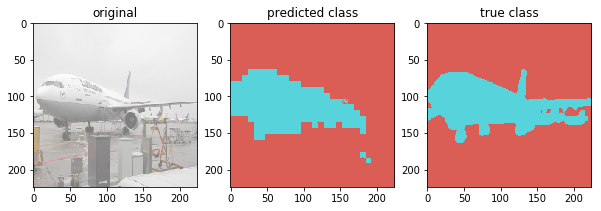

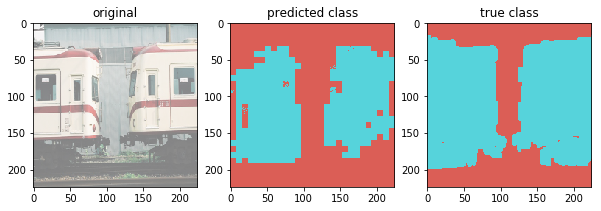

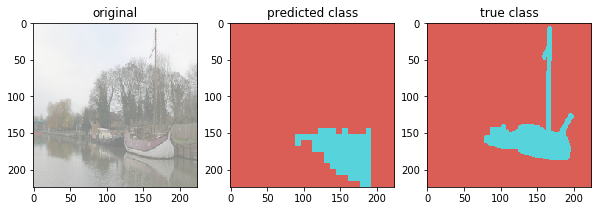

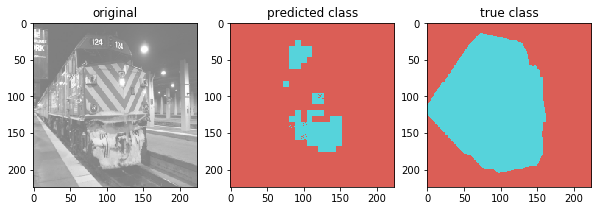

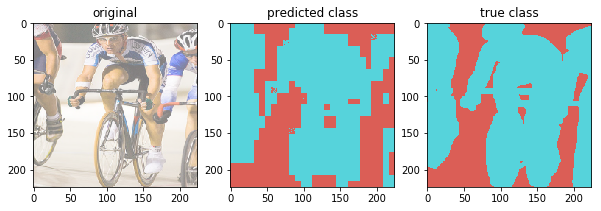

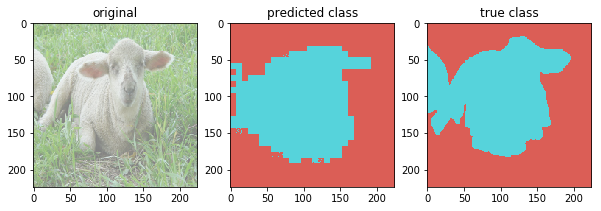

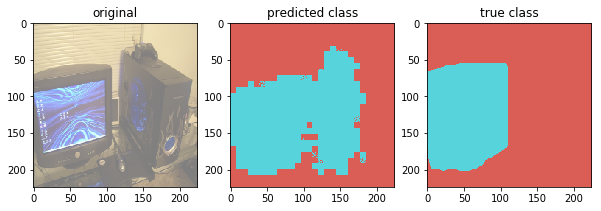

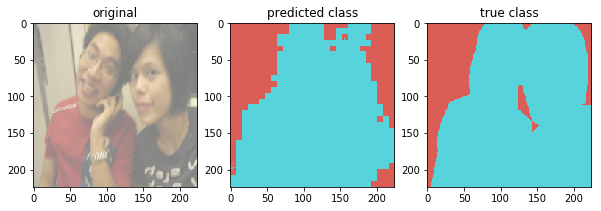

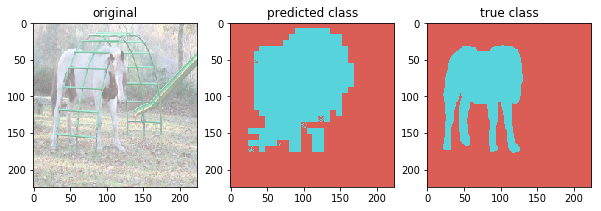

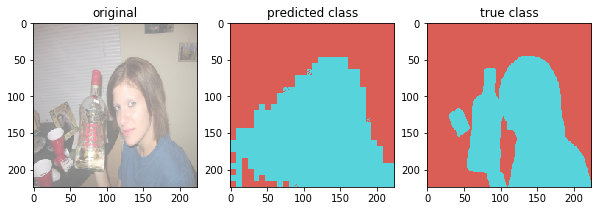

In [0]:
shape = (224,224)
n_classes= 2 #10

for i in range(10):
    img_is  = (xval[i] + 1)*(255.0/2)
    seg = y_predi[i]
    segtest = y_vali[i]

    fig = plt.figure(figsize=(10,30))    
    ax = fig.add_subplot(1,3,1)
    ax.imshow(img_is/255.0)
    ax.set_title("original")
    
    ax = fig.add_subplot(1,3,2)
    ax.imshow(give_color_to_seg_img(seg,n_classes))
    ax.set_title("predicted class")
    
    ax = fig.add_subplot(1,3,3)
    ax.imshow(give_color_to_seg_img(segtest,n_classes))
    ax.set_title("true class")
    plt.show()

## U-net model test


In [0]:
def unet(pretrained_weights = None,input_size = (256,256,1)):
    inputs = Input(input_size)
    conv1 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(inputs)
    conv1 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)
    conv2 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool1)
    conv2 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)
    conv3 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool2)
    conv3 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)
    conv4 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool3)
    conv4 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv4)
    drop4 = Dropout(0.5)(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(drop4)

    conv5 = Conv2D(1024, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool4)
    conv5 = Conv2D(1024, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv5)
    drop5 = Dropout(0.5)(conv5)

    up6 = Conv2D(512, 2, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling2D(size = (2,2))(drop5))
    merge6 = concatenate([drop4,up6], axis = 3)
    conv6 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge6)
    conv6 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv6)

    up7 = Conv2D(256, 2, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling2D(size = (2,2))(conv6))
    merge7 = concatenate([conv3,up7], axis = 3)
    conv7 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge7)
    conv7 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv7)

    up8 = Conv2D(128, 2, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling2D(size = (2,2))(conv7))
    merge8 = concatenate([conv2,up8], axis = 3)
    conv8 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge8)
    conv8 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv8)

    up9 = Conv2D(64, 2, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling2D(size = (2,2))(conv8))
    merge9 = concatenate([conv1,up9], axis = 3)
    conv9 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge9)
    conv9 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv9)
    conv9 = Conv2D(2, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv9)
    conv10 = Conv2D(1, 1, activation = 'sigmoid')(conv9)

    model = Model(input = inputs, output = conv10)

    model.compile(optimizer = Adam(lr = 1e-4), loss = 'binary_crossentropy', metrics = ['accuracy'])
    
    #model.summary()

    if(pretrained_weights):
    	model.load_weights(pretrained_weights)

    return model
